<a href="https://colab.research.google.com/github/kartickgupta/multilabel-text-classification-BERT/blob/main/EDA_ACLED_Data.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [196]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from google.colab import drive
import seaborn as sns
import re
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer, PorterStemmer
from nltk.tokenize import word_tokenize
from wordcloud import WordCloud
# nltk.download('all')
from textwrap import wrap
%matplotlib inline

In [100]:
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Indian Data

In [101]:
with open('/content/drive/MyDrive/India.csv', 'r') as f:
    india_df = pd.read_csv(f, index_col=0, delimiter=';')
india_df.head()

,iso,event_id_cnty,event_id_no_cnty,event_date,year,time_precision,event_type,sub_event_type,actor1,assoc_actor_1,inter1,interaction,region,country,admin1,admin2,admin3,location,latitude,longitude,geo_precision,source,source_scale,notes,fatalities,timestamp,iso3
data_id,,,,,,,,,,,,,,,,,,,,,,,,,,,
8384005,356,IND96785,96785,09 July 2021,2021,1,Protests,Peaceful protest,Protesters (India),LPF: Labour Progressive Federation; Labour Gro...,6,60,South Asia,India,Tamil Nadu,Krishnagiri,Krishnagiri,Krishnagiri,12.5192,78.2138,1,The Hindu,National,"On 9 July 2021, members of the LPF and DMK hel...",0,1626212811,IND
8383761,356,IND96773,96773,09 July 2021,2021,1,Protests,Peaceful protest,Protesters (India),Fishermen (India),6,60,South Asia,India,Karnataka,Dakshina Kannada,Mangaluru,Mangaluru,12.9172,74.8560,1,Deccan Herald,Subnational,"On 9 July 2021, fishermen held a protest in Ma...",0,1626212811,IND
8384017,356,IND96784,96784,09 July 2021,2021,1,Protests,Peaceful protest,Protesters (India),INC: Indian National Congress,6,60,South Asia,India,Tamil Nadu,Erode,Erode,Erode,11.3428,77.7274,1,The Hindu,National,"On 9 July 2021, members of the INC held a prot...",0,1626212811,IND
8383769,356,IND96763,96763,09 July 2021,2021,1,Protests,Protest with intervention,Protesters (India),Bajrang Dal,6,16,South Asia,India,Jammu and Kashmir,Jammu,Jammu,Jammu,32.7357,74.8691,1,Greater Kashmir,Subnational,"On 9 July 2021, police intervened to stop Bajr...",0,1626212811,IND
8383769,356,IND96763,96763,09 July 2021,2021,1,Protests,Protest with intervention,Police Forces of India (2014-),NaN,1,16,South Asia,India,Jammu and Kashmir,Jammu,Jammu,Jammu,32.7357,74.8691,1,Greater Kashmir,Subnational,"On 9 July 2021, police intervened to stop Bajr...",0,1626212811,IND


In [102]:
india_df.shape

(78549, 27)

## Text Preprocessing

### Chech NULL Data

In [104]:
india_df.isnull().sum()

iso                     0
event_id_cnty           0
event_id_no_cnty        0
event_date              0
year                    0
time_precision          0
event_type              0
sub_event_type          0
actor1                  0
assoc_actor_1       25731
inter1                  0
interaction             0
region                  0
country                 0
admin1                  0
admin2                 16
admin3               1276
location                0
latitude                0
longitude               0
geo_precision           0
source                  0
source_scale            0
notes                   0
fatalities              0
timestamp               0
iso3                    0
dtype: int64

### Datetime conversion

In [103]:
# Convert Date from to datetime format
from datetime import datetime

def text_to_date(d):
    d = d[: -5] + ', ' + d[-4:]
    return datetime.strptime(d, "%d %B, %Y").strftime('%d-%m-%Y')

india_df['event_date'] = india_df['event_date'].apply(text_to_date)

### Text Cleaning

In [105]:
# Remove Excess [Size:: ] from EoS
def remove_size(text):
	result = re.search("\[size", text)
	if result is not None:
		text = text[:result.start()]
	return text.strip()

months = ['january', 'jan', 'feb', 'mar', 'apr', 'aug', 'sept', 'oct', 'nov', 'dec', 'feburary', 'february', 'march', 'april', 'may', 'june', 'july', 'august', 'september', 'october', 'november', 'december', 'on']
def remove_months(text):
    text = text.split()
    text = [word for word in text if word.lower() not in set(months)]
    text = ' '.join(text)
    return text

def remove_nums(text):
    result = re.sub(r'[0-9+]', '', text)
    return result

def remove_punctuation(text):
    text = re.sub(r'[^\w\s]','',text)
    return text

def remove_parenthesis_text(text):
    result = re.sub(r"\([^()]*\)", "", text)
    return result

def text_cleaning(text):
    text = remove_size(text)
    text = remove_nums(text)
    text = remove_parenthesis_text(text)
    text = remove_months(text)
    text = remove_punctuation(text)    
    return text.strip()

india_df['cleaned'] = india_df['notes'].apply(text_cleaning)
print(india_df['cleaned'].iloc[:10])

data_id
8384005    members of the LPF and DMK held a protest in K...
8383761    fishermen held a protest in Mangaluru city aga...
8384017    members of the INC held a protest in Erode cit...
8383769    police intervened to stop Bajrang Dal members ...
8383769    police intervened to stop Bajrang Dal members ...
8383771    scores of villagers protested at Kaloosa town ...
8383772    RR CRPF and SoG exchanged fire with unidentifi...
8383772    RR CRPF and SoG exchanged fire with unidentifi...
8383773    locals protested at Kuhroo village in Handwara...
8383522    dozens of panches led by a BJP leader proteste...
Name: cleaned, dtype: object


### Lemmatization

In [110]:
lemmatizer = WordNetLemmatizer()
def lemmatizing_headlines(text):
    tokens = word_tokenize(text.lower())
    tokens = [lemmatizer.lemmatize(word) for word in tokens if word not in set(stopwords.words('english'))]
    return ' '.join(tokens).strip()

india_df['lemmatized'] = india_df.cleaned.apply(lemmatizing_headlines)


In [112]:
for i in india_df.lemmatized.iloc[:10]:
    print(i)

member lpf dmk held protest krishnagiri city increase fuel price
fisherman held protest mangaluru city costal berth project claimed would affect livelihood huge corporate industry would able begin fishing area completion project
member inc held protest erode city increase fuel price
police intervened stop bajrang dal member protesting jammu city pdp president boycott delimitation commission
police intervened stop bajrang dal member protesting jammu city pdp president boycott delimitation commission
score villager protested kaloosa town demand repair road bad condition
rr crpf sog exchanged fire unidentified militant redwani town casualty inflicted encounter
rr crpf sog exchanged fire unidentified militant redwani town casualty inflicted encounter
local protested kuhroo village handwara tehsil water department shortage regular drinking water
dozen panches led bjp leader protested billawar city proposed merger dharlata pallan parnal muni village basohli


### Stemming

In [113]:
stemmer = PorterStemmer()
def stemmed_headlines(text):
    tokens = word_tokenize(text.lower())
    tokens = [stemmer.stem(word) for word in tokens if word not in set(stopwords.words('english'))]
    return ' '.join(tokens).strip()

india_df['stemmed'] = india_df.cleaned.apply(stemmed_headlines)


In [114]:
for i in india_df.stemmed.iloc[:10]:
    print(i)

member lpf dmk held protest krishnagiri citi increas fuel price
fishermen held protest mangaluru citi costal berth project claim would affect livelihood huge corpor industri would abl begin fish area complet project
member inc held protest erod citi increas fuel price
polic interven stop bajrang dal member protest jammu citi pdp presid boycott delimit commiss
polic interven stop bajrang dal member protest jammu citi pdp presid boycott delimit commiss
score villag protest kaloosa town demand repair road bad condit
rr crpf sog exchang fire unidentifi milit redwani town casualti inflict encount
rr crpf sog exchang fire unidentifi milit redwani town casualti inflict encount
local protest kuhroo villag handwara tehsil water depart shortag regular drink water
dozen panch led bjp leader protest billawar citi propos merger dharlata pallan parnal muni villag basohli


In [106]:
string = india_df['cleaned'].iloc[0]
string

'members of the LPF and DMK held a protest in Krishnagiri city against the increase in fuel prices'

## Event Based Analysis

### Frequency Distribution of Each Event

In [255]:
india_df.sub_event_type.value_counts()

Peaceful protest                      42327
Mob violence                          12328
Armed clash                            5644
Protest with intervention              5496
Violent demonstration                  4943
Attack                                 4856
Disrupted weapons use                   795
Remote explosive/landmine/IED           591
Looting/property destruction            372
Grenade                                 360
Arrests                                 220
Sexual violence                         172
Abduction/forced disappearance          166
Agreement                                74
Excessive force against protesters       72
Change to group/activity                 43
Shelling/artillery/missile attack        43
Other                                    39
Air/drone strike                          4
Suicide bomb                              2
Non-violent transfer of territory         1
Headquarters or base established          1
Name: sub_event_type, dtype: int

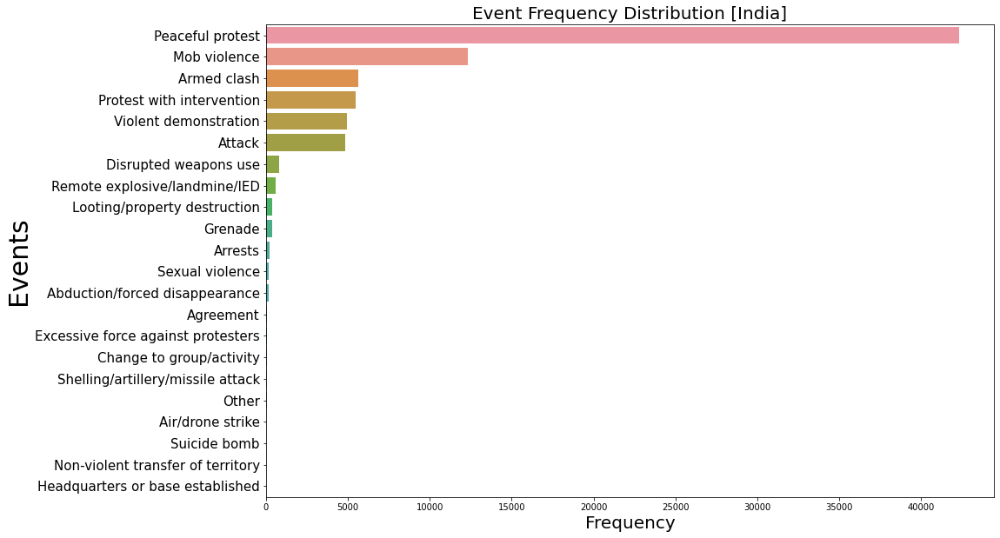

In [293]:
x = india_df['sub_event_type'].value_counts()
y = x.index
plt.figure(figsize=(15, 10))
g = sns.barplot(x=x, y=y)
plt.title("Event Frequency Distribution [India]", fontsize=20)
plt.ylabel('Events', fontsize= 30)
plt.yticks(fontsize=15)
plt.xlabel('Frequency', fontsize=20)
plt.xticks(fontsize=10)
plt.show()

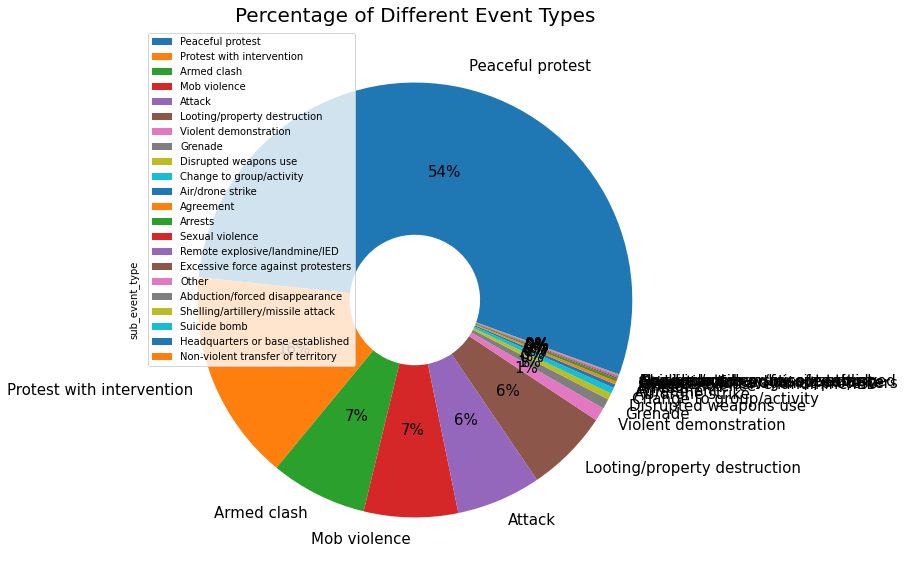

In [109]:
plt.figure(figsize=(30,10))
plt.title('Percentage of Different Event Types', fontsize=20)
india_df.sub_event_type.value_counts().plot(kind='pie', labels= india_df.sub_event_type.unique(),
                              wedgeprops=dict(width=.7), autopct='%1.0f%%', startangle= -20, 
                              textprops={'fontsize': 15})
plt.legend(loc='upper left')
plt.show()

### India-processed-headlines.csv
Here, the **india_processed_text_df** is being save as *India-processed-headlines.csv* in google-drive which contains:


*   Date
*   Type
*   Sub Event Type
*   Original Headline
*   Cleaned Headline
*   Lemmatized Headline
*   Stemmed Headline



In [121]:
india_processed_text_df  = india_df.drop(columns=['iso', 'event_id_cnty', 'event_id_no_cnty', 'year',
       'time_precision', 'actor1', 'assoc_actor_1', 'inter1', 'interaction', 'region', 'country', 'admin1', 'admin2', 'admin3', 'location', 'latitude', 'longitude','geo_precision', 'source', 'source_scale','fatalities',
       'timestamp', 'iso3'])

In [ ]:
with open('/content/drive/MyDrive/Shared-Task-2021/India-processed-headlines.csv', 'r') as f:
    india_processed_text_dff = pd.read_csv(f)

In [122]:
india_processed_text_df.head()

,event_date,event_type,sub_event_type,notes,cleaned,lemmatized,stemmed
data_id,,,,,,,
8384005,09-07-2021,Protests,Peaceful protest,"On 9 July 2021, members of the LPF and DMK hel...",members of the LPF and DMK held a protest in K...,member lpf dmk held protest krishnagiri city i...,member lpf dmk held protest krishnagiri citi i...
8383761,09-07-2021,Protests,Peaceful protest,"On 9 July 2021, fishermen held a protest in Ma...",fishermen held a protest in Mangaluru city aga...,fisherman held protest mangaluru city costal b...,fishermen held protest mangaluru citi costal b...
8384017,09-07-2021,Protests,Peaceful protest,"On 9 July 2021, members of the INC held a prot...",members of the INC held a protest in Erode cit...,member inc held protest erode city increase fu...,member inc held protest erod citi increas fuel...
8383769,09-07-2021,Protests,Protest with intervention,"On 9 July 2021, police intervened to stop Bajr...",police intervened to stop Bajrang Dal members ...,police intervened stop bajrang dal member prot...,polic interven stop bajrang dal member protest...
8383769,09-07-2021,Protests,Protest with intervention,"On 9 July 2021, police intervened to stop Bajr...",police intervened to stop Bajrang Dal members ...,police intervened stop bajrang dal member prot...,polic interven stop bajrang dal member protest...


### Grouping Data on Sub-Event-Basis

In [130]:
df_grouped=india_processed_text_df[['sub_event_type','lemmatized']].groupby(by='sub_event_type')

In [201]:

df_grouped=india_processed_text_df[['sub_event_type','lemmatized']].groupby(by='sub_event_type').agg(lambda x:' '.join(x))
print(df_grouped.shape)
df_grouped.head()

(22, 1)


,lemmatized
sub_event_type,
Abduction/forced disappearance,three employee oil natural gas corporation abd...
Agreement,cpimaoist cadre including militia commander su...
Air/drone strike,drone strike suspected conducted across ib let...
Armed clash,rr crpf sog exchanged fire unidentified milita...
Arrests,joint police team including crpf member arrest...


## Term Document Matrix

In [203]:
from sklearn.feature_extraction.text import CountVectorizer

cv = CountVectorizer(analyzer='word')
data=cv.fit_transform(df_grouped['lemmatized'])
df_dtm = pd.DataFrame(data.toarray(), columns=cv.get_feature_names())
df_dtm.index=df_grouped.index
df_dtm.head(3)

,aa,aaam,aaaru,aac,aada,aadarsh,aadesh,aadhaar,aadhar,aadivasi,aadmi,aaeu,aahar,aahubari,aaikya,aain,aaisu,aaj,aakil,aakkheda,aakrosh,aakurmukkutu,aalathambadi,aalayas,aali,aalo,aam,aamdai,aamguri,aamsu,aanaikatti,aanchal,aanchar,aanganwadi,aap,aapacsu,aapawhu,aapled,aaps,aapsu,...,zirlai,ziro,zirpora,zo,zobawk,zoland,zomato,zomi,zomuantlang,zonal,zone,zonea,zoned,zonei,zoneiii,zonimar,zoning,zoo,zoocumbotanical,zoological,zoonimar,zorihunterganj,zou,zoumunnuam,zoupi,zoveng,zp,zpc,zptc,zptcs,zradipora,zrari,zuf,zufjenchui,zufkamson,zugu,zungalpora,zunheboto,zurigund,zuzuvadi
sub_event_type,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Abduction/forced disappearance,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
Agreement,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,8,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
Air/drone strike,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


### Top (K=15) most frequent words in Each Event Type.

In [295]:
K = 15
for index in df_dtm.index:
    word_dict = df_dtm.loc[index].sort_values(ascending=False).to_dict()
    print(index, " :", list(word_dict.keys())[:K])

Abduction/forced disappearance  : ['abducted', 'village', 'militant', 'released', 'suspected', 'area', 'later', 'police', 'kidnapped', 'group', 'three', 'employee', 'construction', 'worker', 'rescued']
Agreement  : ['surrendered', 'police', 'commander', 'district', 'cadre', 'lakh', 'cpimaoist', 'reward', 'including', 'militia', 'force', 'carrying', 'agreement', 'maoist', 'militant']
Air/drone strike  : ['two', 'suspected', 'bomb', 'across', 'iaf', 'strike', 'ib', 'sector', 'explosion', 'satwari', 'air', 'damage', 'later', 'dropped', 'drone']
Armed clash  : ['force', 'area', 'fire', 'exchanged', 'across', 'loc', 'sector', 'pakistan', 'india', 'militant', 'military', 'killed', 'indian', 'police', 'village']
Arrests  : ['arrested', 'police', 'arrest', 'leader', 'village', 'force', 'delhi', 'district', 'city', 'detained', 'protest', 'farmer', 'attack', 'area', 'member']
Attack  : ['police', 'village', 'attacked', 'killed', 'shot', 'area', 'unidentified', 'injured', 'city', 'bjp', 'two', 'g

## WordCloud for each Sub-Event 

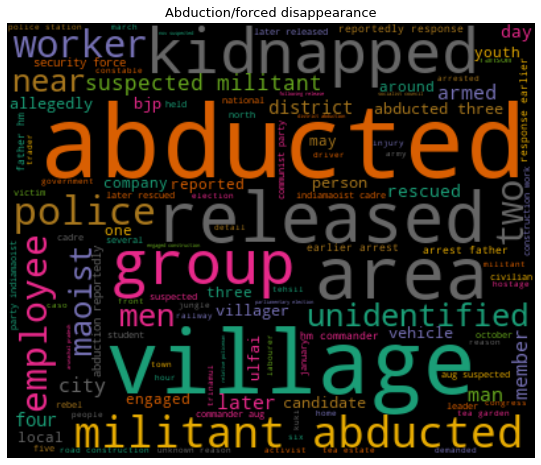

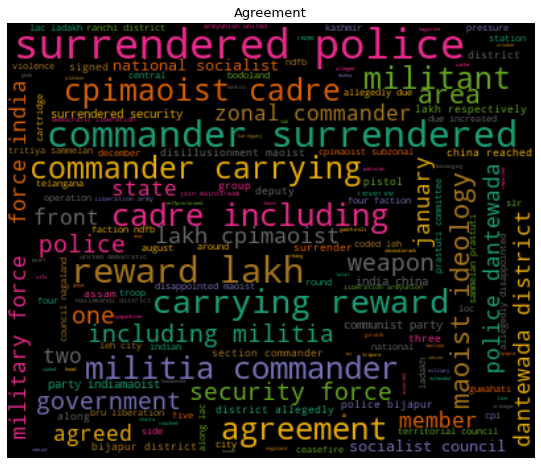

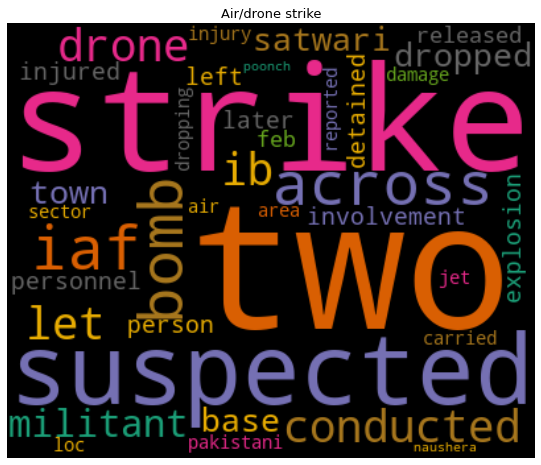

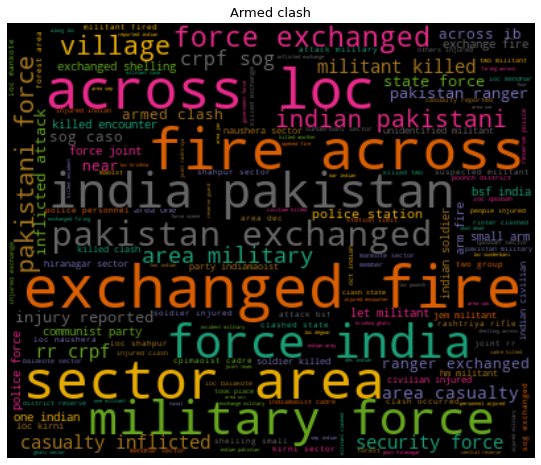

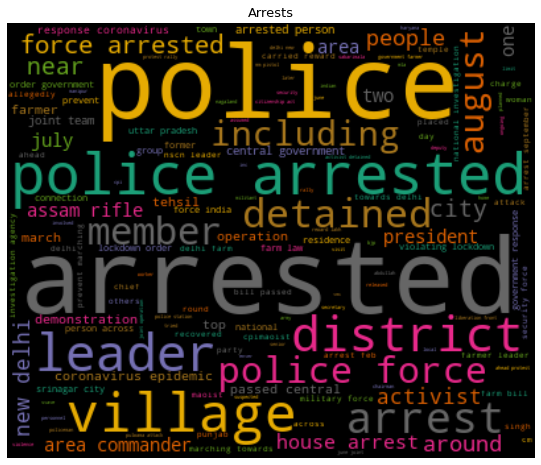

...

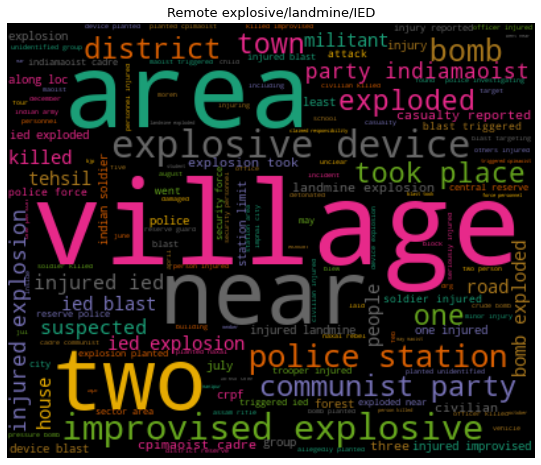

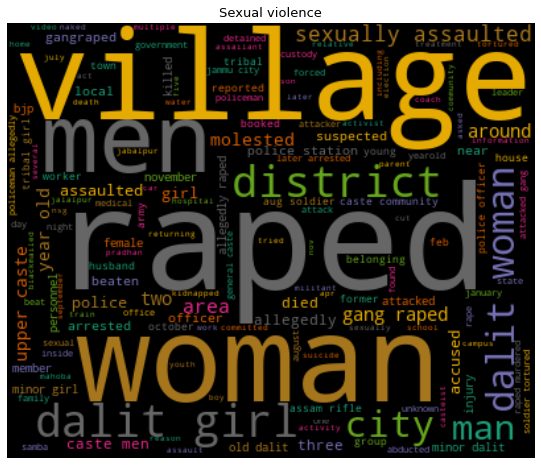

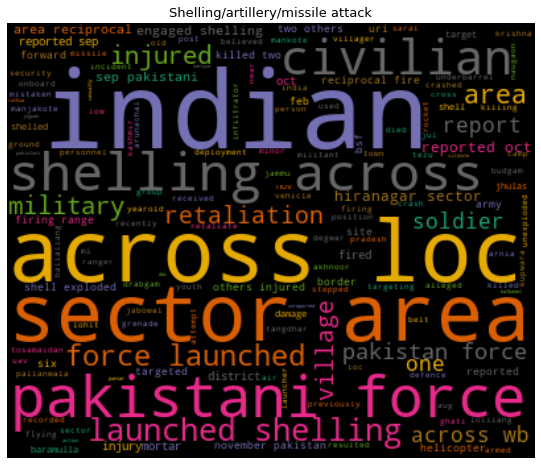

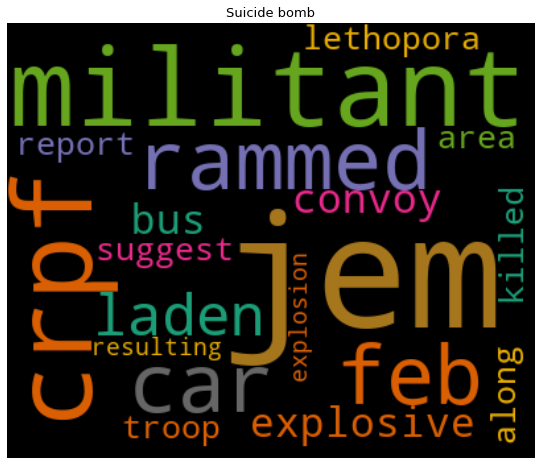

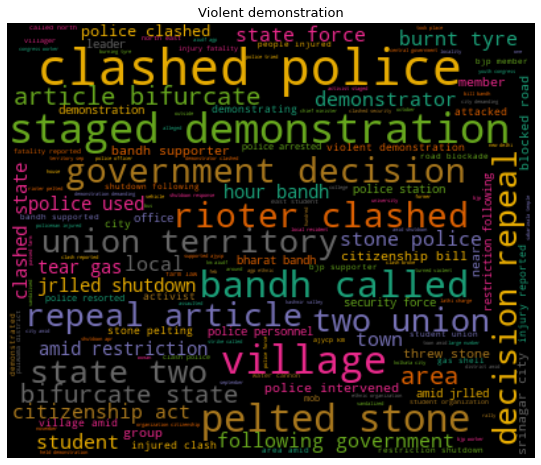

In [195]:
def generate_wordcloud(data,title):
  wc = WordCloud(width=400, height=330, max_words=150,colormap="Dark2").generate(data)
  plt.figure(figsize=(10,8))
  plt.imshow(wc, interpolation='bilinear')
  plt.axis("off")
  plt.title('\n'.join(wrap(title,60)),fontsize=13)
  plt.show()

for index in df_grouped.index:
    generate_wordcloud(list(df_grouped.loc[index])[0], index)


# Global Data

In [224]:
with open('/content/drive/MyDrive/ACLED-Data.csv', 'r') as f:
    global_df = pd.read_csv(f, delimiter=';', index_col= 0)

/usr/local/lib/python3.7/dist-packages/numpy/lib/arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)


In [225]:
global_df.head()

,iso,event_id_cnty,event_id_no_cnty,event_date,year,time_precision,event_type,sub_event_type,actor1,assoc_actor_1,inter1,interaction,region,country,admin1,admin2,admin3,location,latitude,longitude,geo_precision,source,source_scale,notes,fatalities,timestamp,iso3
data_id,,,,,,,,,,,,,,,,,,,,,,,,,,,
8378880,760,SYR92334,92334,09 July 2021,2021,1,Explosions/Remote violence,Shelling/artillery/missile attack,Military Forces of Syria (2000-),NaN,1,10,Middle East,Syria,Idleb,Ariha,Ehsem,Arnaba,35.7015,36.4583,1,Liveuamap; SOHR,Local partner-New media,"On 9 July 2021, regime forces shelled Arnaba t...",0,1626126314,SYR
8378881,760,SYR92335,92335,09 July 2021,2021,1,Explosions/Remote violence,Shelling/artillery/missile attack,Military Forces of Syria (2000-),NaN,1,10,Middle East,Syria,Idleb,Ariha,Ehsem,Balyun,35.6957,36.5084,1,SOHR; Liveuamap,Local partner-New media,"On 9 July 2021, regime forces shelled Balyun t...",0,1626126314,SYR
8381441,410,KOR18231,18231,09 July 2021,2021,1,Protests,Peaceful protest,Protesters (South Korea),Former Military Forces of South Korea (2017-),6,60,East Asia,South Korea,South Gyeongsang,Jinju,NaN,Jinju,35.1803,128.1087,1,YNA,National,"On 9 July 2021, local veterans' organizations,...",0,1626187703,KOR
8383746,586,PAK68304,68304,09 July 2021,2021,1,Riots,Violent demonstration,Rioters (Pakistan),Prisoners (Pakistan),5,50,South Asia,Pakistan,Sindh,Larkana,Larkana,Larkana,27.5637,68.2150,1,Daily Times (Pakistan),National,"On 9 July 2021, prisoners held a demonstration...",0,1626212811,PAK
8381699,104,MMR19514,19514,09 July 2021,2021,1,Violence against civilians,Attack,Unidentified Armed Group (Myanmar),NaN,3,37,Southeast Asia,Myanmar,Yangon,Yangon-South,Thongwa,Hpa Yar Gyi,16.7569,96.6168,1,Myanmar Labour News,National,"On 9 July 2021, in Hpa Yar Gyi village (Thongw...",1,1626194594,MMR


In [226]:
global_df.shape

(1034527, 27)

### null Values check

In [228]:
global_df.isnull().sum()

iso                      0
event_id_cnty            0
event_id_no_cnty         0
event_date               0
year                     0
time_precision           0
event_type               0
sub_event_type           0
actor1                   0
assoc_actor_1       648770
inter1                   0
interaction              0
region                   0
country                  0
admin1                 103
admin2               41637
admin3              581650
location                 0
latitude                 0
longitude                0
geo_precision            0
source                   0
source_scale             0
notes                    0
fatalities               0
timestamp                0
iso3                     0
dtype: int64

## Text Preprocessing

### Text Cleaning

In [229]:
%%time
global_df['cleaned'] = global_df['notes'].apply(text_cleaning)

CPU times: user 48.3 s, sys: 891 ms, total: 49.2 s
Wall time: 49.3 s


In [230]:
for text in global_df.cleaned[:10]:
    print(text)

regime forces shelled Arnaba town in Idleb countryside with rockets Neither injuries nor fatalities were reported
regime forces shelled Balyun town and its vicinity in Idleb countryside with heavy artillery and rockets Neither injuries nor fatalities were reported
local veterans organizations including the Korean War Veterans Association held a press conference with a banner and picketed at the Jinju City Hall  They opposed the governments plan to disband the Korea Land and Housing Corporation over alleged speculation using development information They argued that it would worsen regional development
prisoners held a demonstration and set wood and clothes fire in Larkana city  against the suspension of the jail superintendent
in Hpa Yar Gyi village  the village administrator was shot three times and killed by unidentified assailants
in Hpa Yar Gyi village  the village administrator was shot three times and killed by unidentified assailants
Taliban militants were killed by Afghan milita

### Datetime conversion

In [227]:
global_df['event_date'] = global_df['event_date'].apply(text_to_date)

### Lemmatization the Headlines

In [231]:
%%time
global_df['lemmatized'] = global_df.cleaned.apply(lemmatizing_headlines)

CPU times: user 1h 11min 26s, sys: 5min 54s, total: 1h 17min 20s
Wall time: 1h 17min 19s


### Stemming the Headlines

In [232]:
%%time
global_df['stemmed'] = global_df.cleaned.apply(stemmed_headlines)

### Saving the Stemmed and Lemmatized data in .csv

In [236]:
global_only_headlines_df = global_df.drop(columns=['iso', 'event_id_cnty', 'event_id_no_cnty',
                                           'time_precision', 'actor1','assoc_actor_1', 'inter1', 'interaction', 'admin1', 'admin2', 'admin3',  'latitude', 'longitude',
                                           'geo_precision', 'source', 'source_scale', 'fatalities','timestamp', 'iso3'])

In [237]:
global_only_headlines_df.columns

Index(['event_date', 'year', 'event_type', 'sub_event_type', 'region',
       'country', 'location', 'notes', 'cleaned', 'lemmatized', 'stemmed'],
      dtype='object')

In [238]:
global_only_headlines_df.head()

,event_date,year,event_type,sub_event_type,region,country,location,notes,cleaned,lemmatized,stemmed
data_id,,,,,,,,,,,
8378880,09-07-2021,2021,Explosions/Remote violence,Shelling/artillery/missile attack,Middle East,Syria,Arnaba,"On 9 July 2021, regime forces shelled Arnaba t...",regime forces shelled Arnaba town in Idleb cou...,regime force shelled arnaba town idleb country...,regim forc shell arnaba town idleb countrysid ...
8378881,09-07-2021,2021,Explosions/Remote violence,Shelling/artillery/missile attack,Middle East,Syria,Balyun,"On 9 July 2021, regime forces shelled Balyun t...",regime forces shelled Balyun town and its vici...,regime force shelled balyun town vicinity idle...,regim forc shell balyun town vicin idleb count...
8381441,09-07-2021,2021,Protests,Peaceful protest,East Asia,South Korea,Jinju,"On 9 July 2021, local veterans' organizations,...",local veterans organizations including the Kor...,local veteran organization including korean wa...,local veteran organ includ korean war veteran ...
8383746,09-07-2021,2021,Riots,Violent demonstration,South Asia,Pakistan,Larkana,"On 9 July 2021, prisoners held a demonstration...",prisoners held a demonstration and set wood an...,prisoner held demonstration set wood clothes f...,prison held demonstr set wood cloth fire larka...
8381699,09-07-2021,2021,Violence against civilians,Attack,Southeast Asia,Myanmar,Hpa Yar Gyi,"On 9 July 2021, in Hpa Yar Gyi village (Thongw...",in Hpa Yar Gyi village the village administra...,hpa yar gyi village village administrator shot...,hpa yar gyi villag villag administr shot three...


In [239]:
# global_only_headlines_df.to_csv('/content/drive/MyDrive/Shared-Task-2021/global-headline-only.csv')

## Country Wise Contribution

In [260]:
country_wise = global_df.country.value_counts()
print("Total Number of Countries :", len(country_wise))
country_wise.head(20)

Total Number of Countries : 194


India                           78549
Syria                           69503
Afghanistan                     68127
Mexico                          67068
Ukraine                         62914
Brazil                          55793
Yemen                           55568
United States                   35345
Pakistan                        27554
Iraq                            24075
Azerbaijan                      23742
Myanmar                         18804
Turkey                          17259
South Korea                     16578
Democratic Republic of Congo    16342
Somalia                         15230
Nigeria                         14735
Palestine                       13628
Colombia                        11235
China                           11028
Name: country, dtype: int64

91.87309756052767

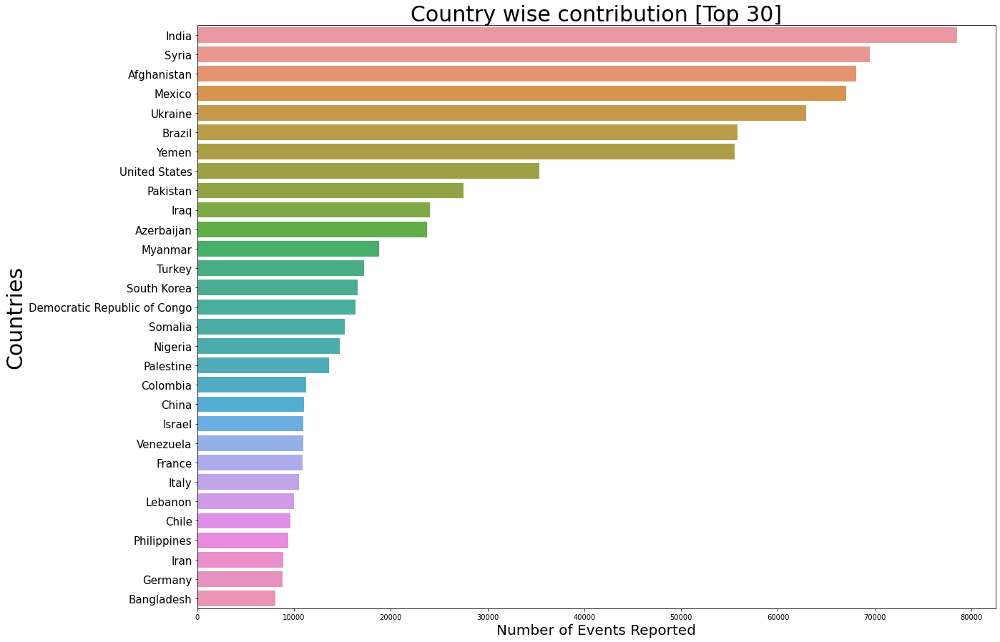

In [286]:
x = global_df['country'].value_counts().iloc[:30]
y = x.index
plt.figure(figsize=(20, 15))
g = sns.barplot(x=x, y=y)
plt.title("Country wise contribution [Top 30]", fontsize=30)
plt.ylabel('Countries', fontsize= 30)
plt.yticks(fontsize=15)
plt.xlabel('Number of Events Reported', fontsize=20)
plt.xticks(fontsize=10)
plt.show()

In [283]:
print("Contribution by 10 Countries : ", country_wise.iloc[:10].sum()/len(global_df) * 100)
print("Contribution by 30 Countries : ",country_wise.iloc[:30].sum()/len(global_df) * 100)
print("Contribution by 60 Countries : ",country_wise.iloc[:60].sum()/len(global_df) * 100)

Contribution by 10 Countries :  52.632362422633726
Contribution by 30 Countries :  77.46390379371442
Contribution by 60 Countries :  91.87309756052767


As we can observe even though data contains events from 156 countries but only 


1.   Only 10 countries comprise more than 50% of the events.
2.   30 countries contribute to 77.4% of the data.
3.   60 countries contribute of 91.8% of the data.



## Event Based Analysis

### Frequency per Event

In [243]:
global_df.sub_event_type.value_counts()

Peaceful protest                       329399
Armed clash                            239828
Attack                                 132202
Shelling/artillery/missile attack       64743
Mob violence                            42079
Violent demonstration                   41003
Air/drone strike                        34020
Protest with intervention               31784
Remote explosive/landmine/IED           30620
Looting/property destruction            24315
Abduction/forced disappearance          14624
Arrests                                  8668
Change to group/activity                 7925
Disrupted weapons use                    7499
Government regains territory             6148
Other                                    5353
Excessive force against protesters       3098
Grenade                                  2948
Non-state actor overtakes territory      2670
Sexual violence                          2196
Agreement                                1460
Non-violent transfer of territory 

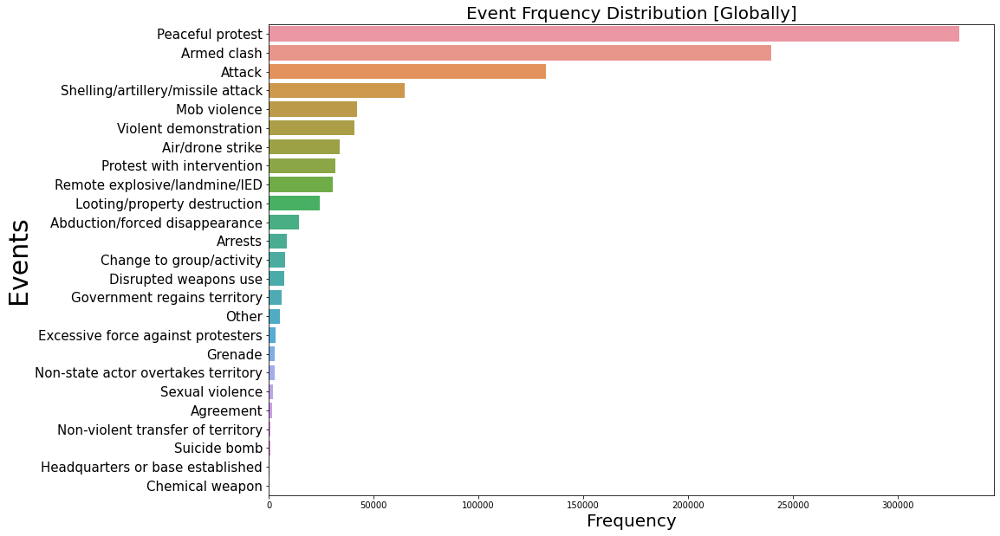

In [290]:
x = global_df['sub_event_type'].value_counts()
y = x.index
plt.figure(figsize=(15, 10))
g = sns.barplot(x=x, y=y)
plt.title("Event Frquency Distribution [Globally]", fontsize=20)
plt.ylabel('Events', fontsize= 30)
plt.yticks(fontsize=15)
plt.xlabel('Frequency', fontsize=20)
plt.xticks(fontsize=10)
plt.show()

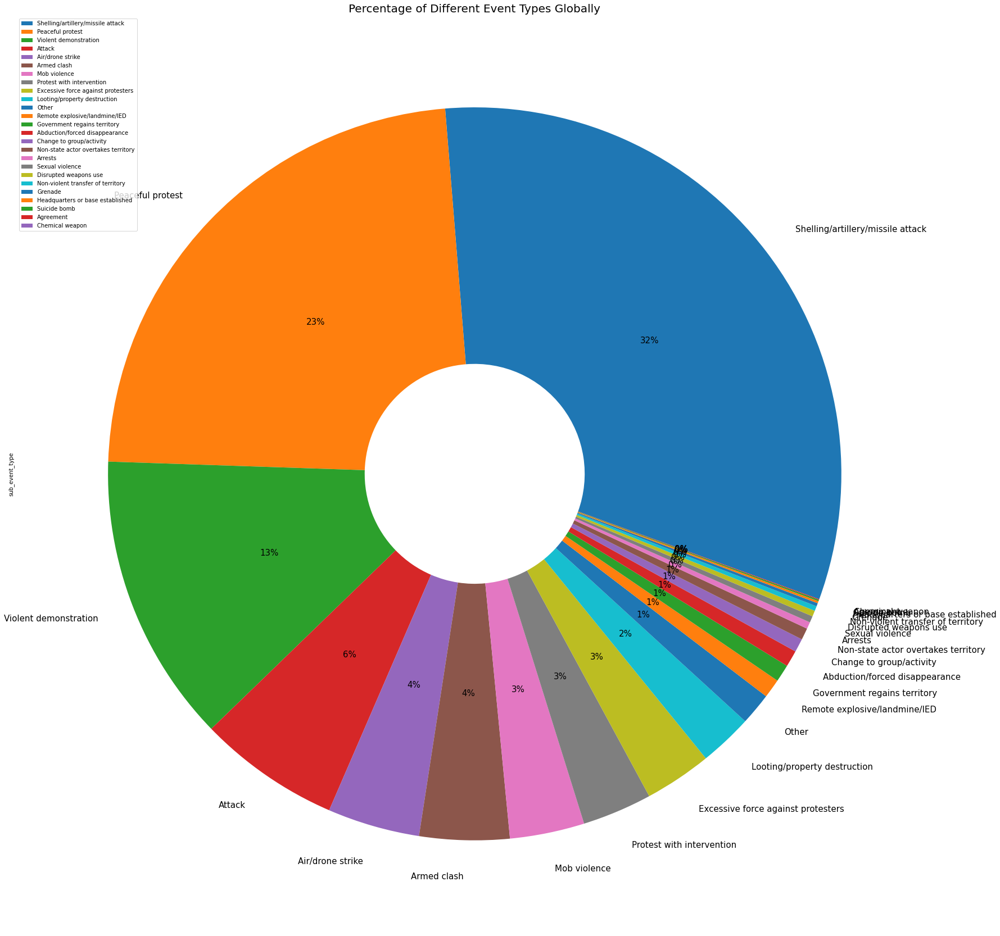

In [287]:
plt.figure(figsize=(30,30))
plt.title('Percentage of Different Event Types Globally', fontsize=20)
global_df.sub_event_type.value_counts().plot(kind='pie', labels= global_df.sub_event_type.unique(),
                              wedgeprops=dict(width=.7), autopct='%1.0f%%', startangle= -20, 
                              textprops={'fontsize': 15})
plt.legend(loc='upper left')
plt.show()

### Grouping Data on Event-Basis

In [297]:

df_grouped_global = global_only_headlines_df[['sub_event_type','lemmatized']].groupby(by='sub_event_type').agg(lambda x:' '.join(x))
print(df_grouped_global.shape)
df_grouped_global.head()

(25, 1)


,lemmatized
sub_event_type,
Abduction/forced disappearance,qsd started security campaign detained six ira...
Agreement,regime force sultan murad division operating j...
Air/drone strike,taliban militant killed afghan military airstr...
Armed clash,clash took place turkey backed opposition rebe...
Arrests,around gendarmerie force captured detained mig...


## Term Document Matrix

In [299]:
from sklearn.feature_extraction.text import CountVectorizer

cv = CountVectorizer(analyzer='word')
data=cv.fit_transform(df_grouped_global['lemmatized'])
df_dtm_global = pd.DataFrame(data.toarray(), columns=cv.get_feature_names())
df_dtm_global.index=df_grouped_global.index
df_dtm_global.head(3)

,__was,_a,_achorro,_acinto,_ad,_aguililla,_ala,_an_uan_e_urigancho,_analich,_and,_angue,_anted_posters,_aptized_it,_ara,_arch,_as,_as_,_as_politician,_asa,_atch_in,_atches_that,_atuco_,_cal,_ction,_demonstrated,_e,_eccion,_ensenada,_esistencia,_et_,_evenge_against,_gropastoril,_his,_ho,_hristmas,_hut,_ic,_ied_to,_ierra,_ight_which,...,zwezwe,zwickau,zwide,zwinah,zwiqat,zwischenahn,zwiyan,zwolle,zwonitz,zwut,zyanat,zyarat,zyayna,zybitskaya,zyglad,zyle,zymohiria,zyrardow,zyrovicy,zyryan,zyuganov,zywiec,zzone,ââ,ââââ,âââã,âââãã,âââããââ,ãs,ãââ,ãââââââa,ãââââââââââo,ãâââââââââãoered,ãâââââââââãâããââ,ãâââââãâããâãâââã,ãâã,ãâãâã,ãâãâããââ,ãâããââ,äöàö
sub_event_type,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Abduction/forced disappearance,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
Agreement,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
Air/drone strike,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


### Top (K=15) most frequent words in Each Event Type.

In [300]:
K = 15
for index in df_dtm_global.index:
    word_dict = df_dtm_global.loc[index].sort_values(ascending=False).to_dict()
    print(index, " :", list(word_dict.keys())[:K])

Abduction/forced disappearance  : ['abducted', 'kidnapped', 'village', 'men', 'civilian', 'armed', 'unidentified', 'unknown', 'two', 'police', 'released', 'arrested', 'group', 'force', 'member']
Agreement  : ['agreement', 'force', 'government', 'surrendered', 'prisoner', 'released', 'taliban', 'part', 'military', 'group', 'fighter', 'afghan', 'area', 'member', 'province']
Air/drone strike  : ['reported', 'airstrikes', 'fatality', 'force', 'district', 'killed', 'militant', 'injury', 'warplane', 'area', 'conducted', 'carried', 'military', 'coalition', 'air']
Armed clash  : ['force', 'military', 'killed', 'fatality', 'militant', 'near', 'reported', 'district', 'position', 'fired', 'area', 'taliban', 'police', 'weapon', 'located']
Arrests  : ['arrested', 'arrest', 'force', 'police', 'military', 'migrant', 'detained', 'security', 'member', 'operation', 'people', 'reported', 'regime', 'town', 'city']
Attack  : ['killed', 'shot', 'man', 'fatality', 'armed', 'men', 'two', 'found', 'police', 'b

## WordCloud for each Event 

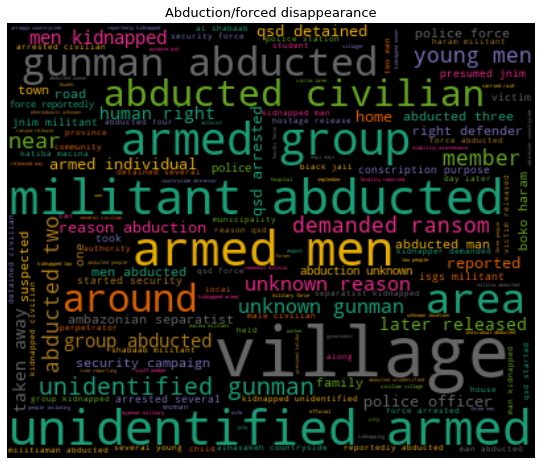

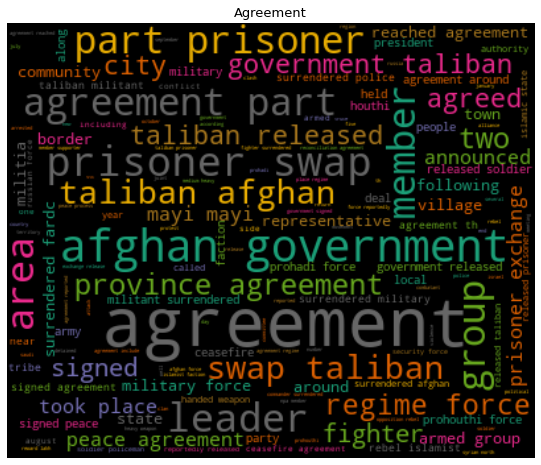

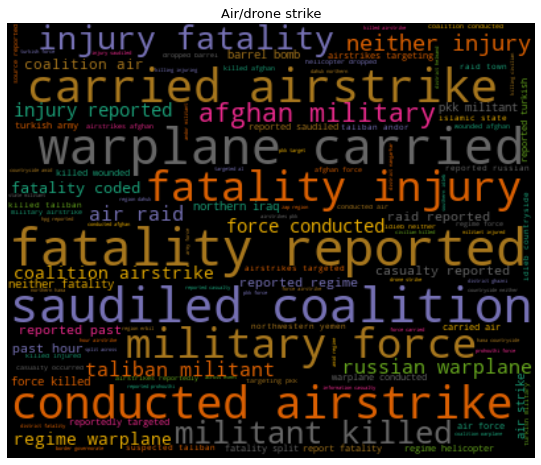

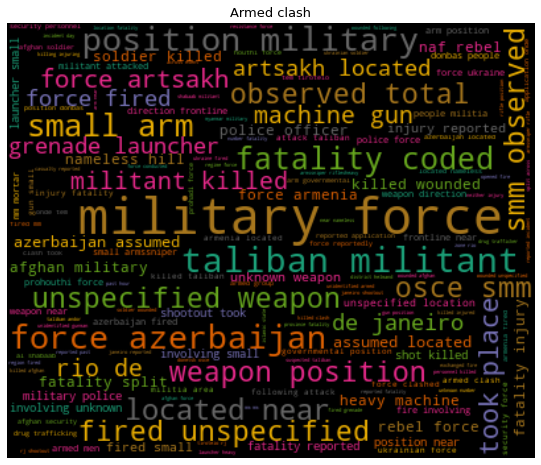

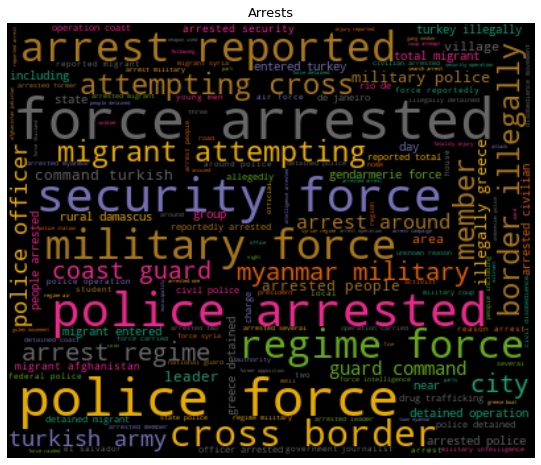

...

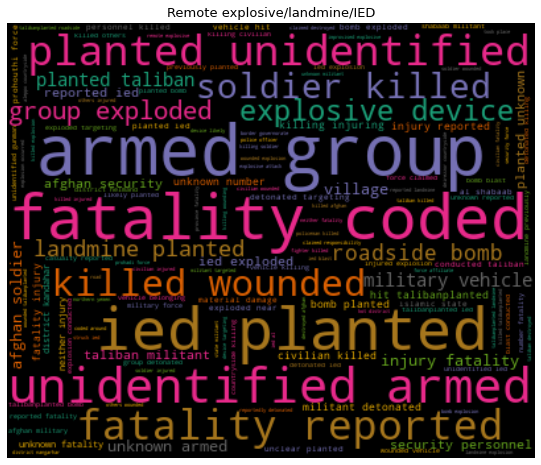

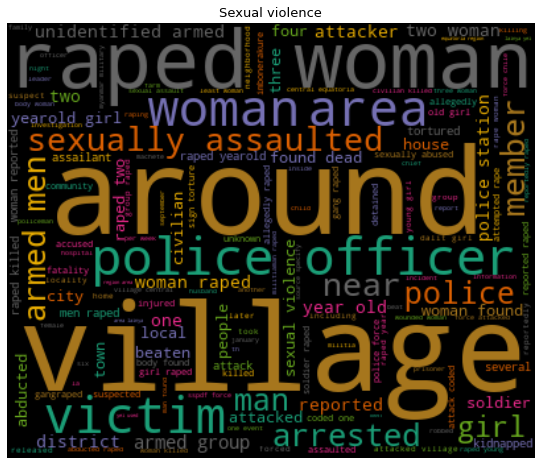

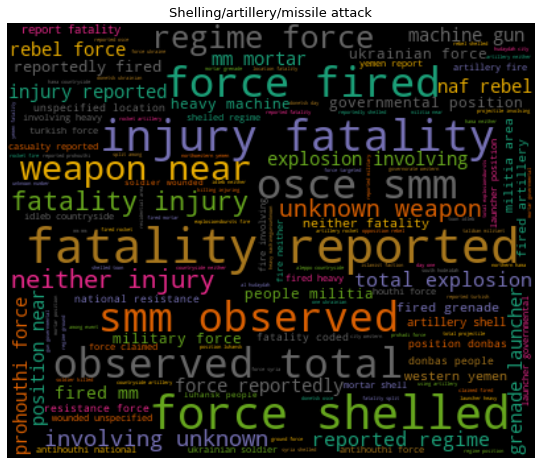

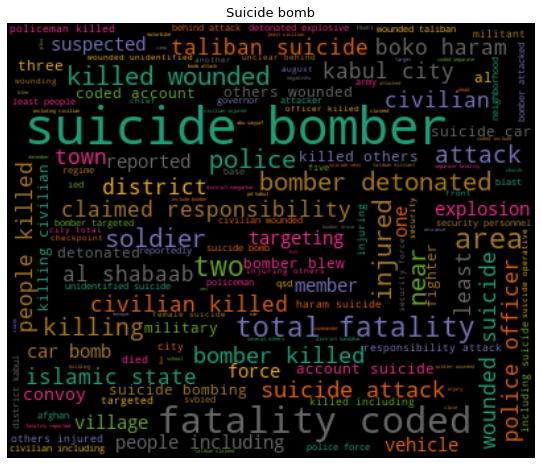

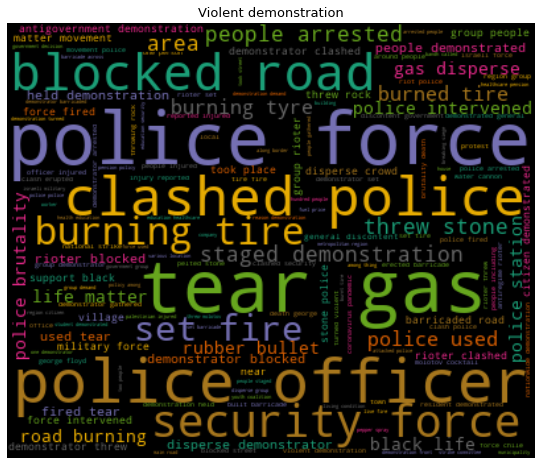

In [305]:
def generate_wordcloud(data,title):
  wc = WordCloud(width=400, height=330, max_words=150,colormap="Dark2").generate(data)
  plt.figure(figsize=(10,8))
  plt.imshow(wc, interpolation='bilinear')
  plt.axis("off")
  plt.title('\n'.join(wrap(title,60)),fontsize=13)
  plt.show()

for index in df_grouped_global.index:
    generate_wordcloud(list(df_grouped_global.loc[index])[0], index)
